# Advanced Lane Finding

Short Prozessing Overview:

        - camera calibration
        - distortion correction
        - binary thresholding
        - perspective transform
        - lane finding
        - curvature and offset calculation
        - inverse perspective transform
        - video processing


In [1]:
import numpy as np
import cv2

import matplotlib
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib inline

import os
import glob
import pickle

camera_cal_pahts  = (glob.glob('camera_cal/*.jpg'))
test_image_paths =  (glob.glob('test_images/*.jpg'))
video_paths = (glob.glob('*video.mp4'))

# Camera Calibration

Open CV is used to detect 9x6 chessboard pattern. If 9x6 chessboard pattern fails a retry with 9x5 is started.

camera_cal\calibration1.jpg


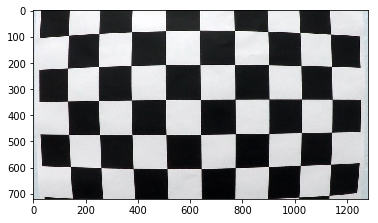

camera_cal\calibration10.jpg


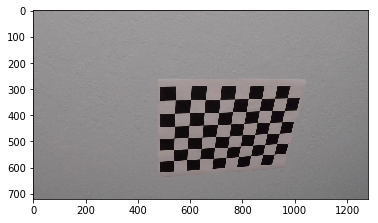

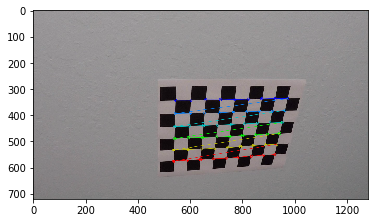

camera_cal\calibration11.jpg


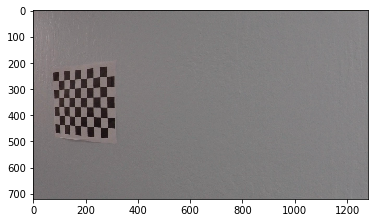

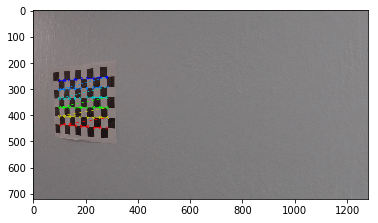

camera_cal\calibration12.jpg


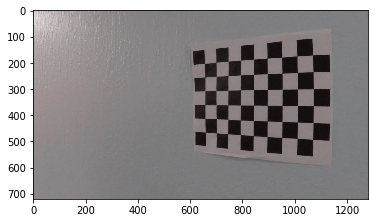

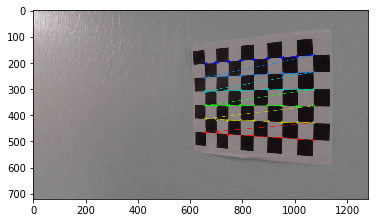

camera_cal\calibration13.jpg


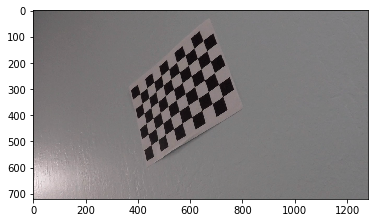

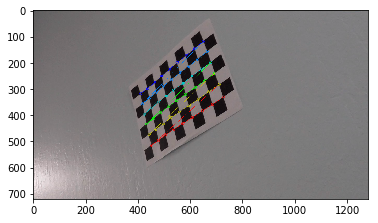

camera_cal\calibration14.jpg


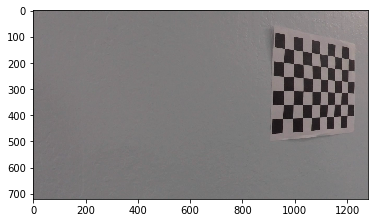

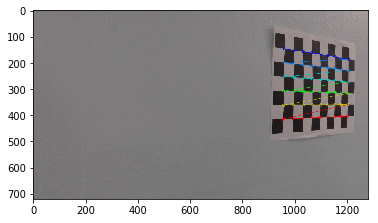

camera_cal\calibration15.jpg


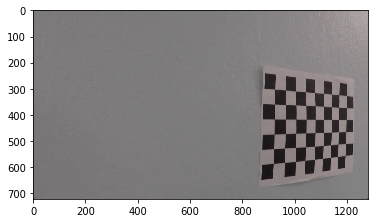

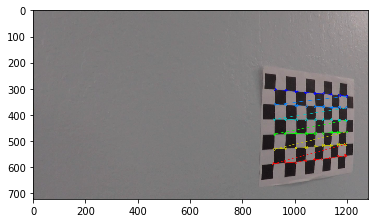

camera_cal\calibration16.jpg


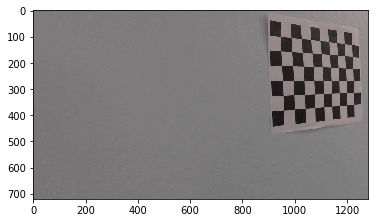

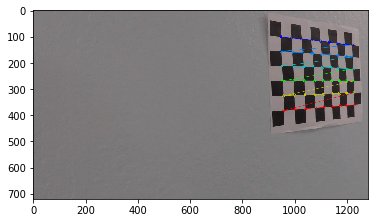

camera_cal\calibration17.jpg


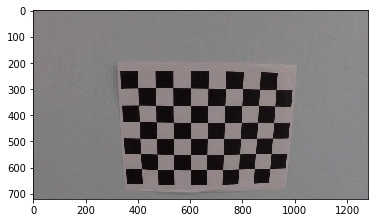

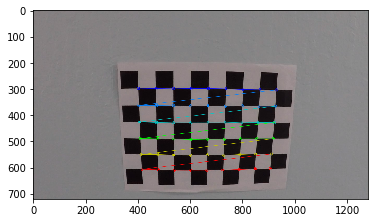

camera_cal\calibration18.jpg


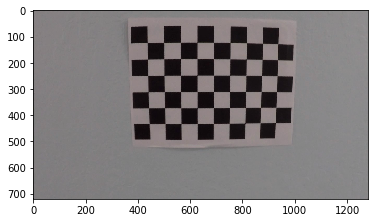

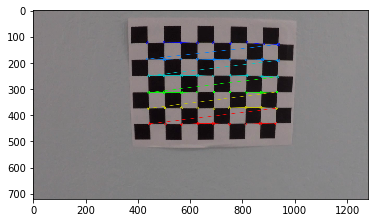

camera_cal\calibration19.jpg


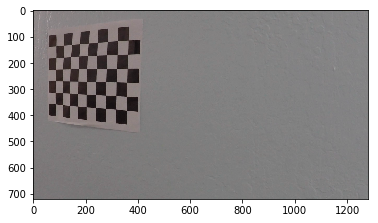

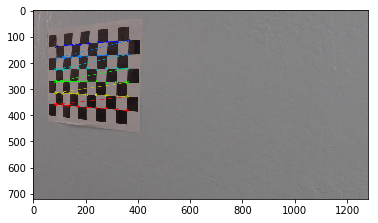

camera_cal\calibration2.jpg


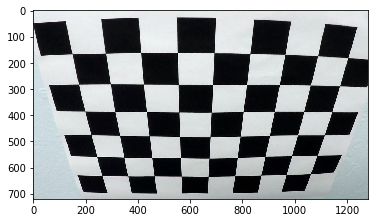

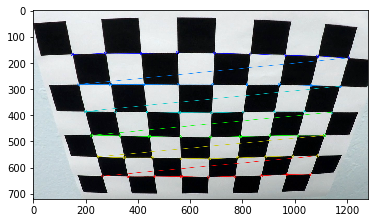

camera_cal\calibration20.jpg


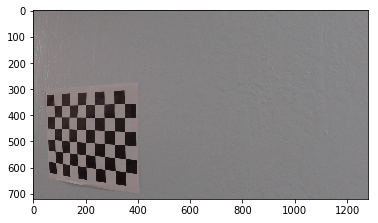

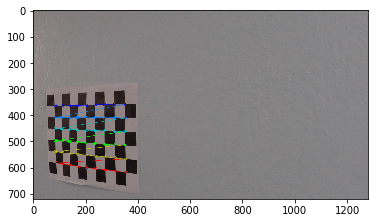

camera_cal\calibration3.jpg


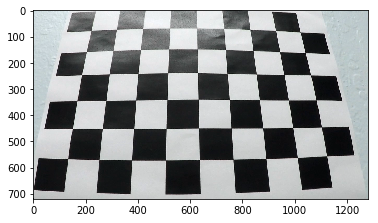

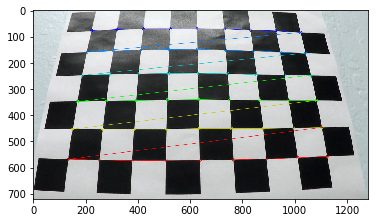

camera_cal\calibration4.jpg


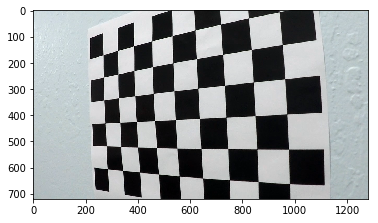

camera_cal\calibration5.jpg


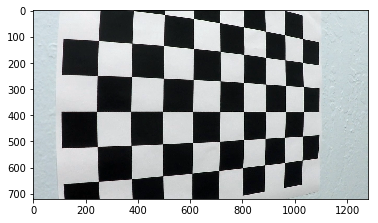

camera_cal\calibration6.jpg


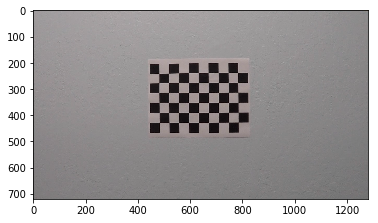

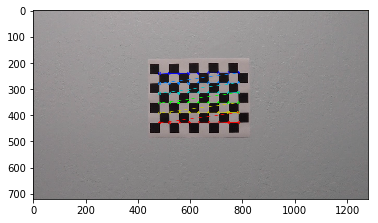

camera_cal\calibration7.jpg


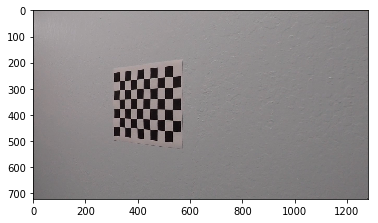

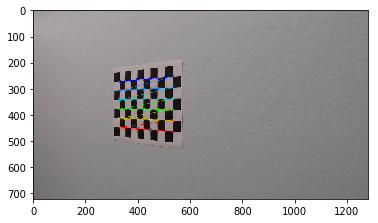

camera_cal\calibration8.jpg


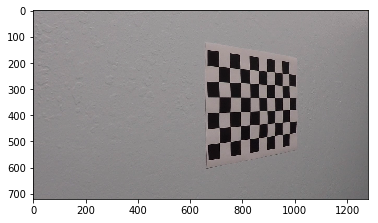

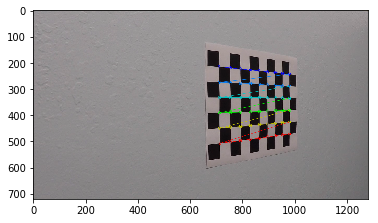

camera_cal\calibration9.jpg


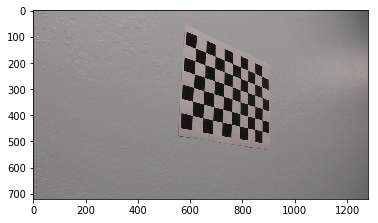

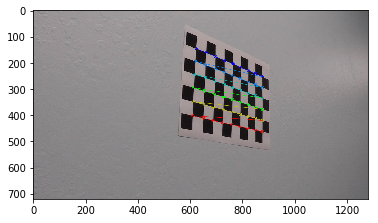

In [2]:
def calc_camara_calibration(calibration_image_pahts = glob.glob('camera_cal/*.jpg')):

    nx_init = 9 #TODO: enter the number of inside corners in x
    ny_init = 6 #TODO: enter the number of inside corners in y
    
    objpoints = []  # 3d point in real world space
    imgpoints = [] # 2d points in image plane.

    # Make a list of calibration images
    
    for fname in calibration_image_pahts:
        
        nx = nx_init
        ny = ny_init
        
        print(fname)
        img = cv2.imread(fname)

        # Convert to grayscale
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

        # Find the chessboard corners
        ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)
        if not ret:
            nx -=1
            ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)
            
        # If found, draw corners
        plt.imshow(img)
        plt.show()
        
        if ret == True:
            # Draw and display the corners
            img_out = cv2.drawChessboardCorners(img, (nx, ny), corners, ret)
            plt.imshow(img_out)
            plt.show()
            
            objp = np.zeros((nx * ny, 3), np.float32)
            objp[:, :2] = np.mgrid[0: nx, 0: ny].T.reshape(-1, 2)
            
            objpoints.append(objp)
            imgpoints.append(corners)
            
    return cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)


ret, mtx, dist, rvecs, tvecs = calc_camara_calibration()

# Pipeline

## Distortion-correction application

Distortion correction that was calculated via camera calibration has been applied to each image. 

camera_cal\calibration1.jpg


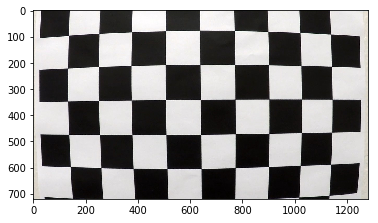

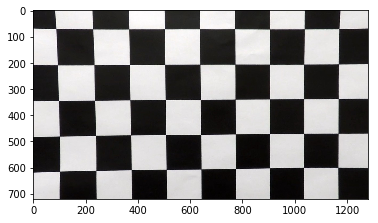

camera_cal\calibration10.jpg


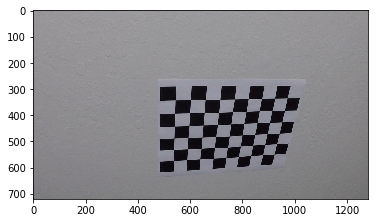

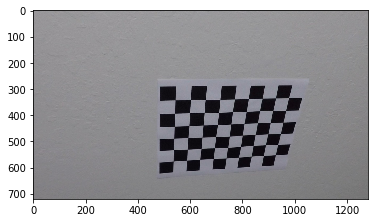

camera_cal\calibration11.jpg


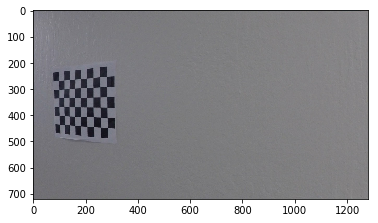

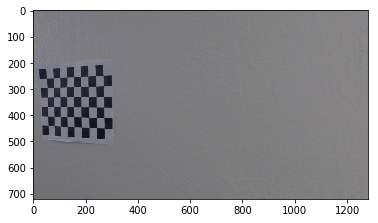

camera_cal\calibration12.jpg


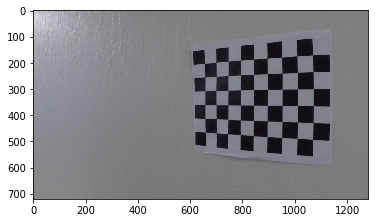

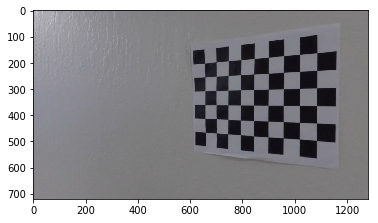

camera_cal\calibration13.jpg


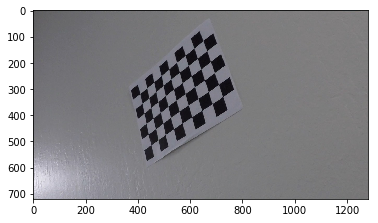

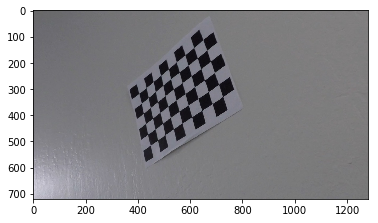

camera_cal\calibration14.jpg


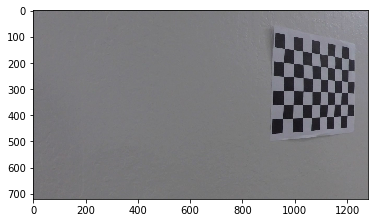

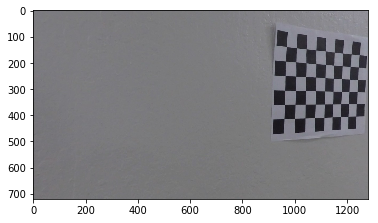

camera_cal\calibration15.jpg


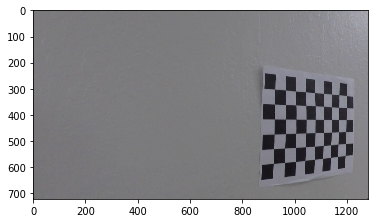

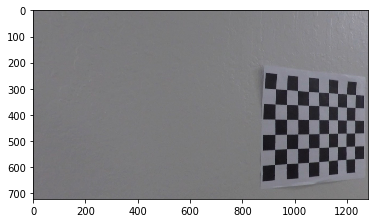

camera_cal\calibration16.jpg


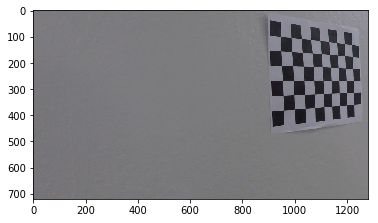

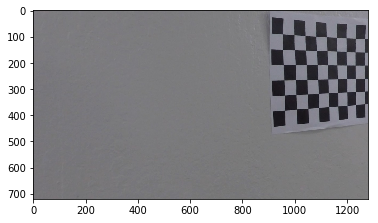

camera_cal\calibration17.jpg


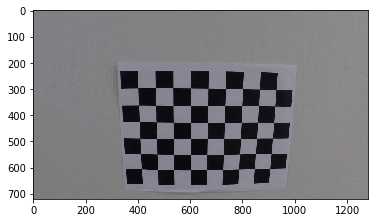

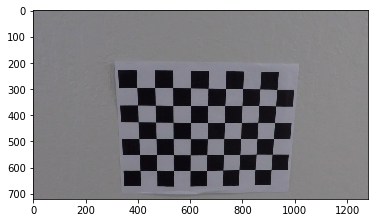

camera_cal\calibration18.jpg


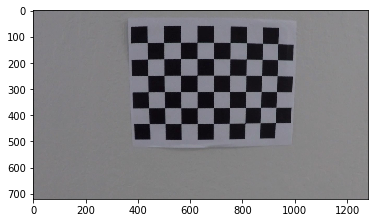

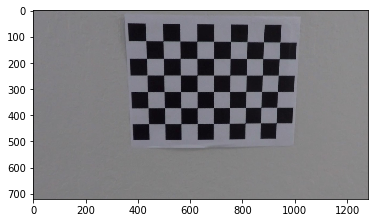

camera_cal\calibration19.jpg


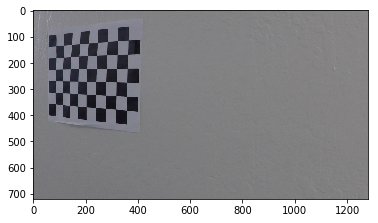

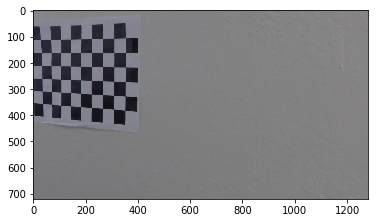

camera_cal\calibration2.jpg


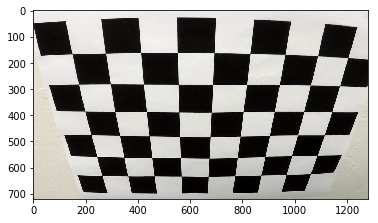

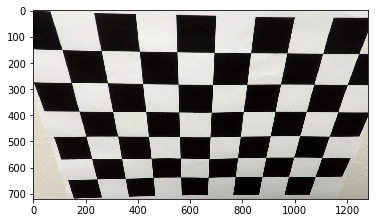

camera_cal\calibration20.jpg


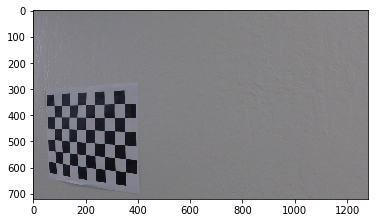

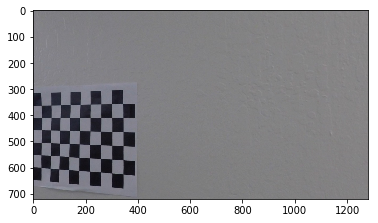

camera_cal\calibration3.jpg


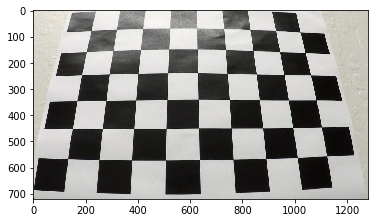

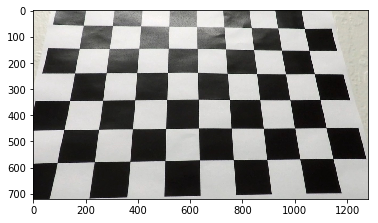

camera_cal\calibration4.jpg


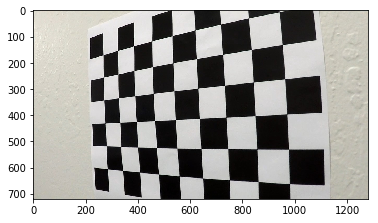

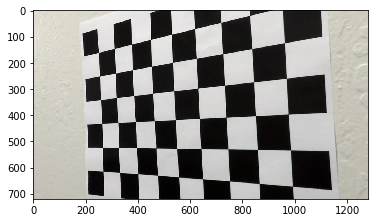

camera_cal\calibration5.jpg


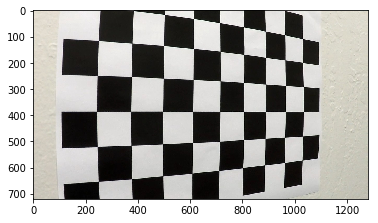

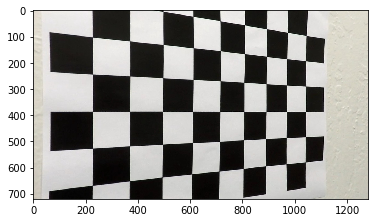

camera_cal\calibration6.jpg


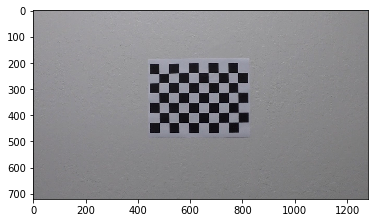

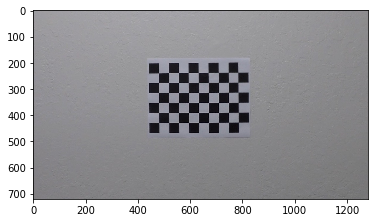

camera_cal\calibration7.jpg


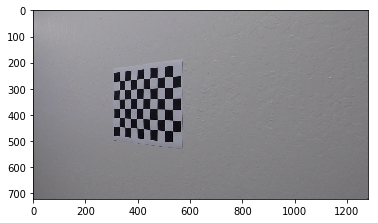

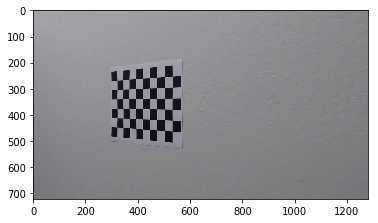

camera_cal\calibration8.jpg


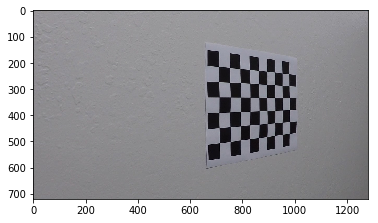

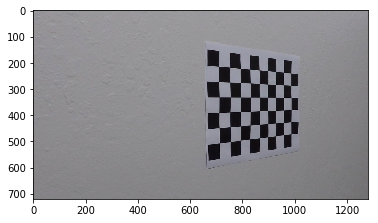

camera_cal\calibration9.jpg


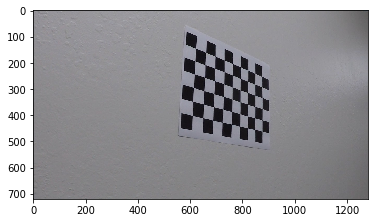

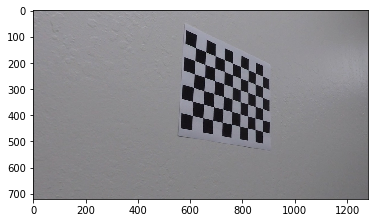

test_images\straight_lines1.jpg


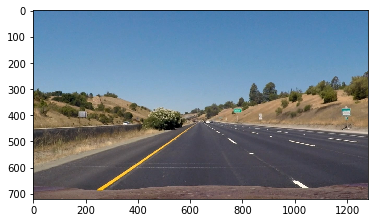

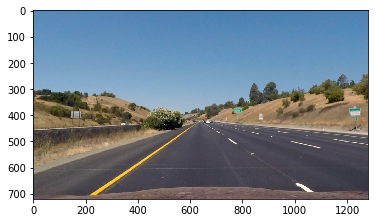

test_images\straight_lines2.jpg


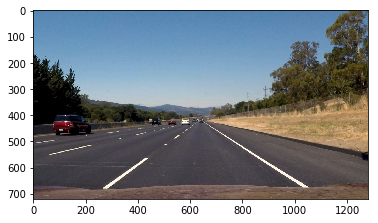

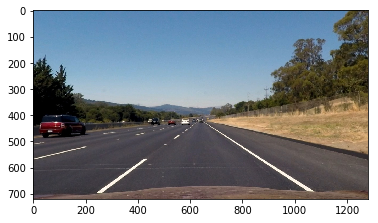

test_images\test1.jpg


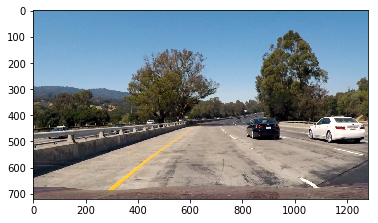

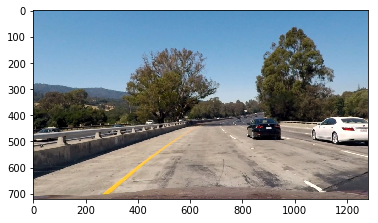

test_images\test2.jpg


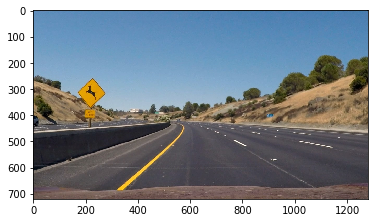

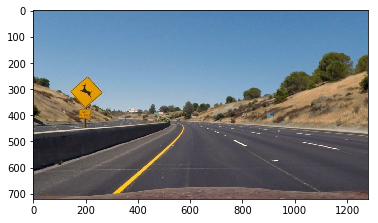

test_images\test3.jpg


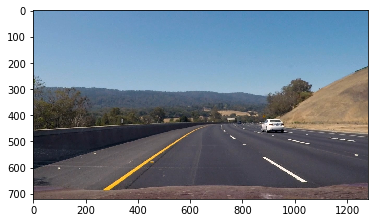

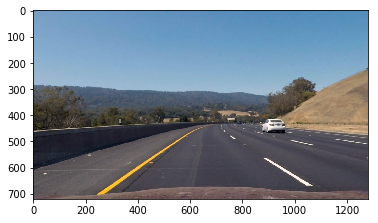

test_images\test4.jpg


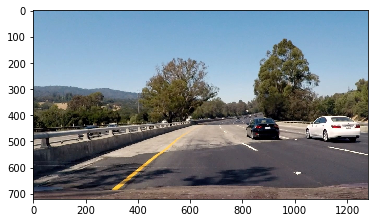

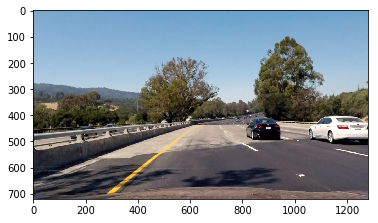

test_images\test5.jpg


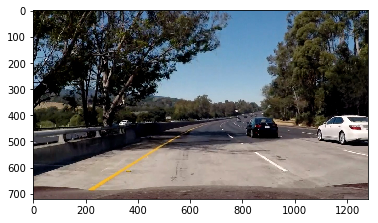

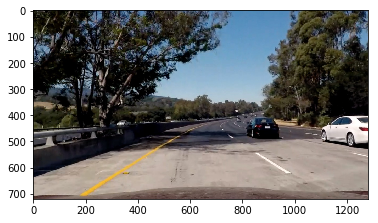

test_images\test6.jpg


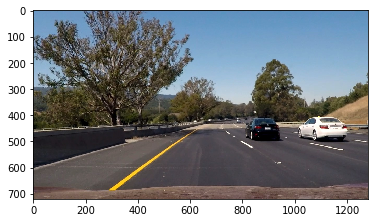

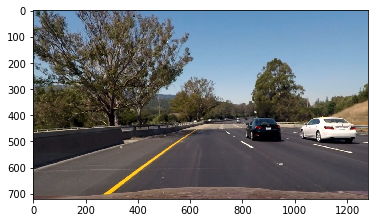

In [3]:
def test_undistort(path):
    print(path)
    img = cv2.imread(path)
    if len(img.shape) == 3:
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    dst = cv2.undistort(img, mtx, dist, None, mtx)
    plt.imshow(img)
    plt.show()
    plt.imshow(dst)
    plt.show()

for img in (camera_cal_pahts):
    test_undistort(img)
    
for img in (test_image_paths):
    test_undistort(img)

## birds-eye view application

OpenCV functions has been used rectify each image to a "birds-eye view". The transform manages Regtion of Interrest implicid with the src and dst transform frames.

The inverse "birds-eye view" transform was also implimentet here (but tested later in the prozessing).

test_images\straight_lines1.jpg


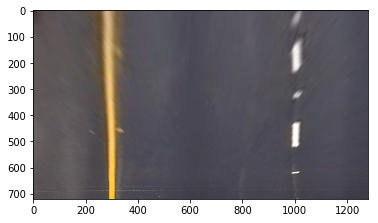

test_images\straight_lines2.jpg


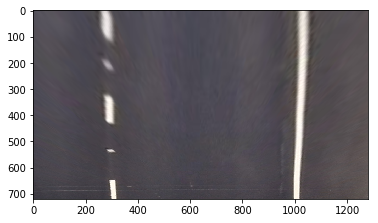

test_images\test1.jpg


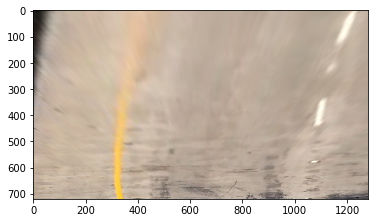

test_images\test2.jpg


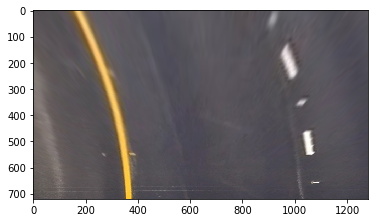

test_images\test3.jpg


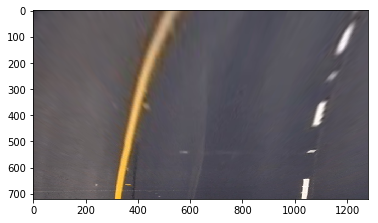

test_images\test4.jpg


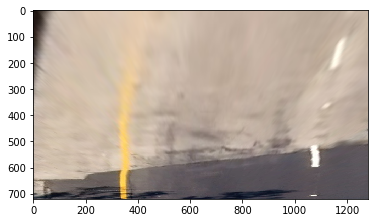

test_images\test5.jpg


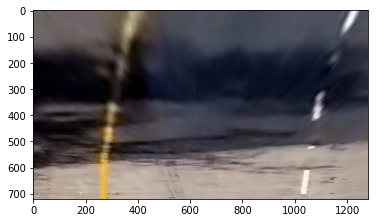

test_images\test6.jpg


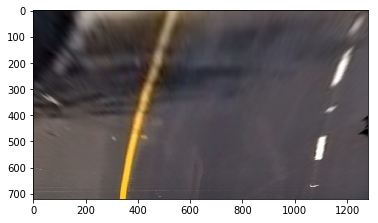

camera_cal\calibration1.jpg


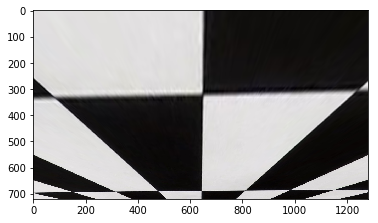

camera_cal\calibration10.jpg


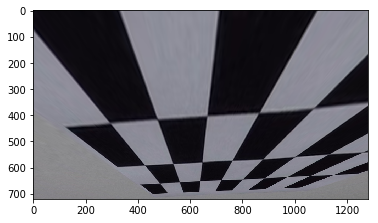

camera_cal\calibration11.jpg


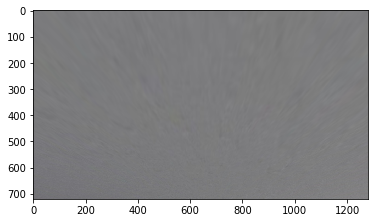

camera_cal\calibration12.jpg


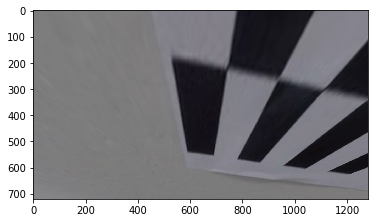

camera_cal\calibration13.jpg


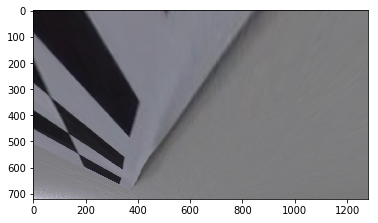

camera_cal\calibration14.jpg


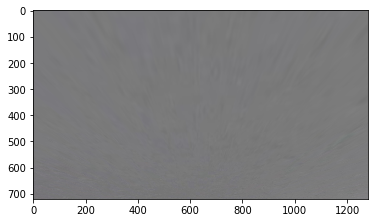

camera_cal\calibration15.jpg


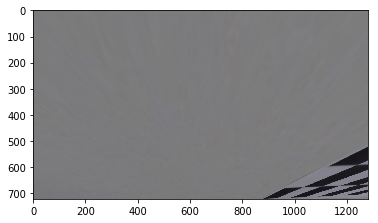

camera_cal\calibration16.jpg


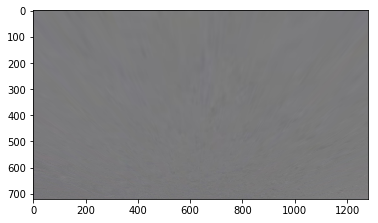

camera_cal\calibration17.jpg


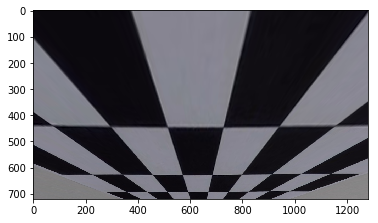

camera_cal\calibration18.jpg


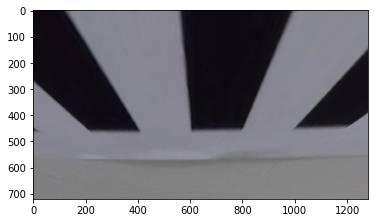

camera_cal\calibration19.jpg


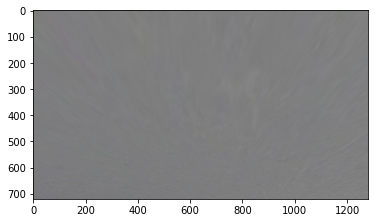

camera_cal\calibration2.jpg


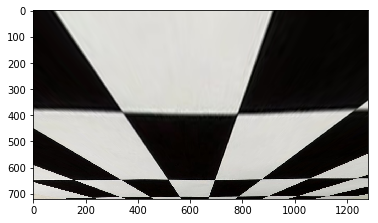

camera_cal\calibration20.jpg


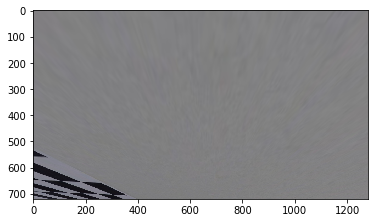

camera_cal\calibration3.jpg


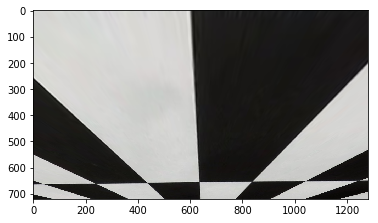

camera_cal\calibration4.jpg


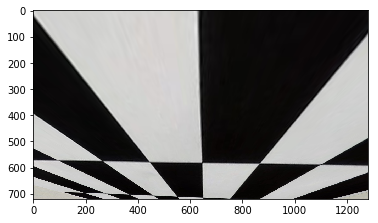

camera_cal\calibration5.jpg


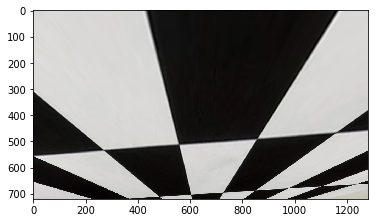

camera_cal\calibration6.jpg


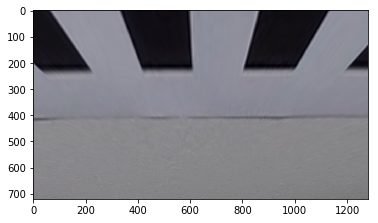

camera_cal\calibration7.jpg


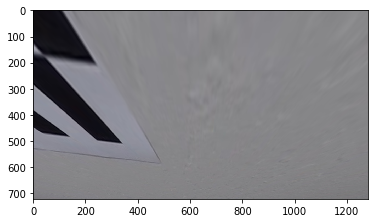

camera_cal\calibration8.jpg


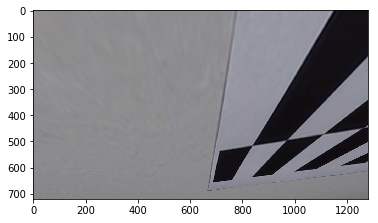

camera_cal\calibration9.jpg


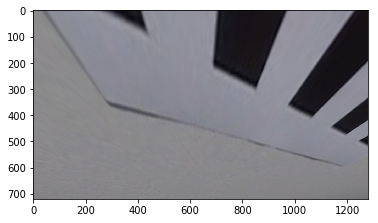

test_images\test6.jpg


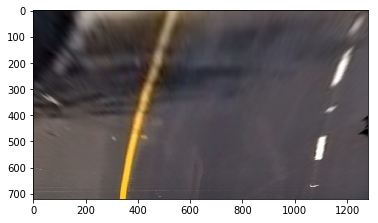

In [4]:
def bird_eye_warp(image,invers = False):
    src = np.float32(
          [[image.shape[1]/2-399,567],
           [image.shape[1]/2+399,567],
           [image.shape[1],655],
           [0             ,655]])
    
    dst = np.float32(
          [[image.shape[1]*0  ,image.shape[0]*0.9],
           [image.shape[1]*1  ,image.shape[0]*0.9],
           [image.shape[1]*1  ,image.shape[0]*1  ],
           [image.shape[1]*0  ,image.shape[0]*1  ]])
    
    if invers:
        M = cv2.getPerspectiveTransform(dst, src)
    else:
        M = cv2.getPerspectiveTransform(src, dst)
        
    #warped = cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_LINEAR)
    wrapped = cv2.warpPerspective(image, M, image.shape[0:2][::-1], flags=cv2.INTER_CUBIC)
    
    return wrapped,src
  
def bird_eye_warp_test(path):
    print(path)
    img = cv2.imread(path)
    if len(img.shape) == 3:
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = cv2.undistort(img, mtx, dist, None, mtx)
    
    wrapped,_ = bird_eye_warp(img)   

    #plt.imshow(img)
    #plt.show()
    plt.imshow(wrapped)
    plt.show()
    
    return wrapped
    

for path in (test_image_paths):
    bird_eye_warp_test(path)
 
for path in (camera_cal_pahts):
    bird_eye_warp_test(path)



wrapped = bird_eye_warp_test(img)

## binary image

A manualy weighted sum of YUV is calculated to sum white and yellow lane information constructive. 
The polar representation of Color in HSV/HLS makes it more complex for handcrafting features right.
Canny was applyed.
I belive that the approach can be much improved /finetuned a lot with a deep lerning insted of handcrafting. 

test_images\straight_lines1.jpg


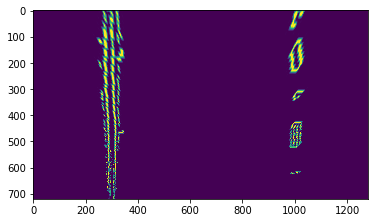

test_images\straight_lines2.jpg


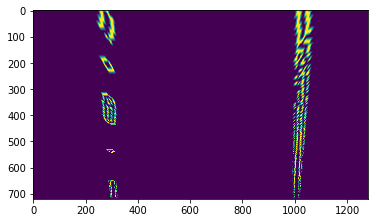

test_images\test1.jpg


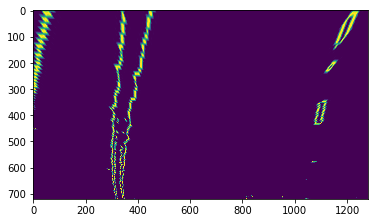

test_images\test2.jpg


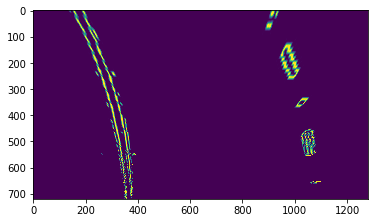

test_images\test3.jpg


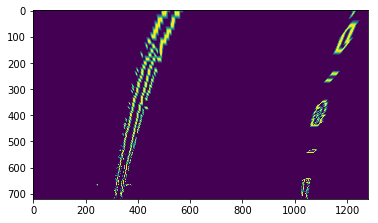

test_images\test4.jpg


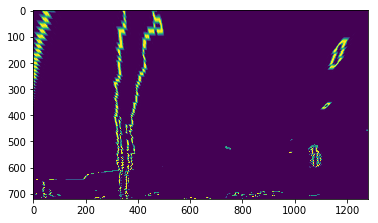

test_images\test5.jpg


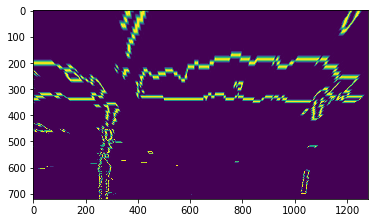

test_images\test6.jpg


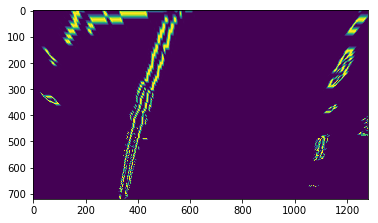

In [5]:
def binarize(wrapped):
    img = cv2.cvtColor(wrapped, cv2.COLOR_RGB2YUV)
    # use mixed colorspace
    
    img = img[:,:,0]+2*img[:,:,1]-2*img[:,:,2]
    # min max normalise
    img = img - np.min(img)
    img = img / np.max(img) * 200
    img = np.uint8(img)
    
    # 
    binary_output = cv2.Canny(img,222,233)
    return binary_output

def binarize_test(path):
    print(path)
    img = cv2.imread(path)
    if len(img.shape) == 3:
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = cv2.undistort(img, mtx, dist, None, mtx)
    #plt.imshow(img)
    #plt.show()
    img = binarize(img)
    #plt.imshow(img)
    #plt.show()
    img,_ = bird_eye_warp(img)   
    plt.imshow(img)
    plt.show()

    return img
    

for path in (test_image_paths):
    binarize_test(path)
 
#for path in (camera_cal_pahts):
#    binarize_test(path)

# Lane Finding

Two way (with and without convolution) were tested for lane finding. The approch without convolution seems to work a little better on my binarized images.

The inverse "birds-eye view" transform was applyed.

test_images\straight_lines1.jpg


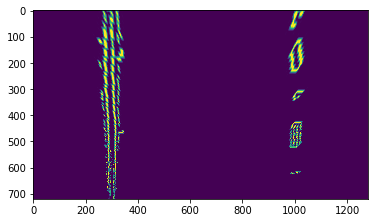

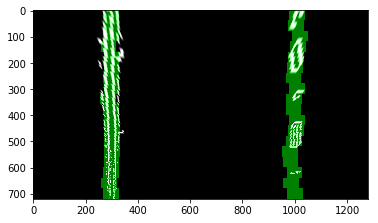

test_images\straight_lines2.jpg


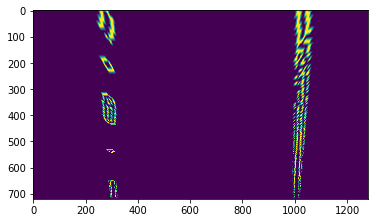

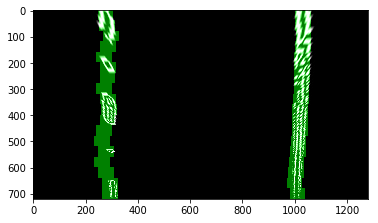

test_images\test1.jpg


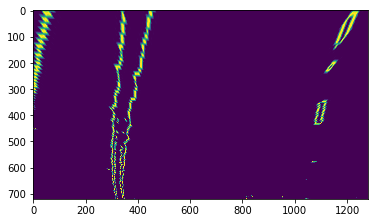

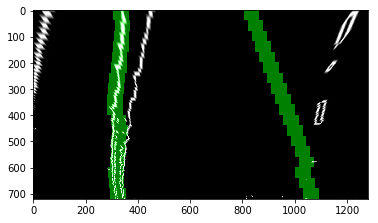

test_images\test2.jpg


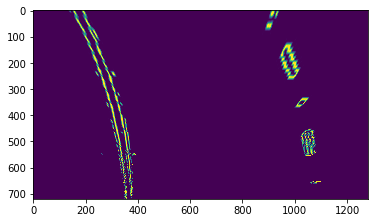

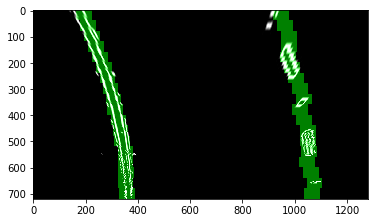

test_images\test3.jpg


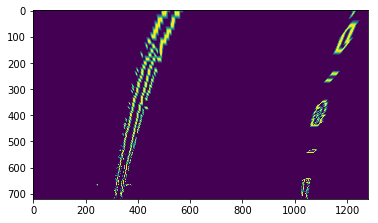

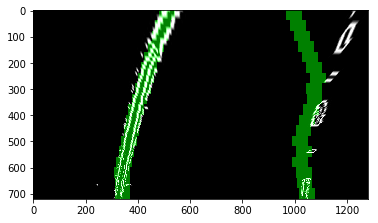

test_images\test4.jpg


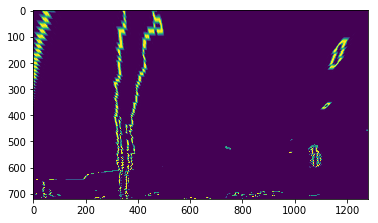

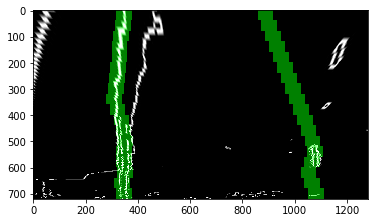

test_images\test5.jpg


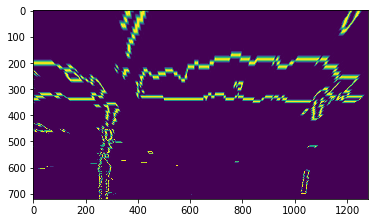

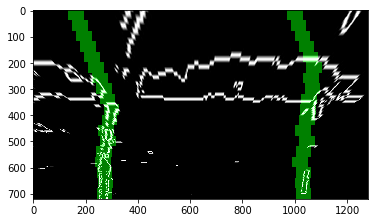

test_images\test6.jpg


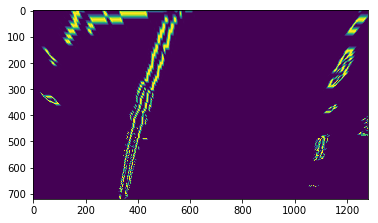

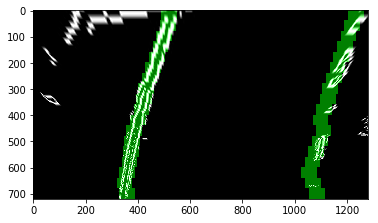

In [6]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import glob
import cv2


def find_lane_windowed(warped):

    # window settings
    window_width = 60 
    window_height = 40 # Break image into 9 vertical layers since image height is 720
    margin = 15 # How much to slide left and right for searching

    def window_mask(width, height, img_ref, center,level):
        output = np.zeros_like(img_ref)
        output[int(img_ref.shape[0]-(level+1)*height):int(img_ref.shape[0]-level*height),max(0,int(center-width/2)):min(int(center+width/2),img_ref.shape[1])] = 1
        return output

    def find_window_centroids(image, window_width, window_height, margin):

        window_centroids = [] # Store the (left,right) window centroid positions per level
        window = np.ones(window_width) # Create our window template that we will use for convolutions

        # First find the two starting positions for the left and right lane by using np.sum to get the vertical image slice
        # and then np.convolve the vertical image slice with the window template 

        # Sum quarter bottom of image to get slice, could use a different ratio
        l_sum = np.sum(warped[int(3*warped.shape[0]/4):,:int(warped.shape[1]/2)], axis=0)
        l_center = np.argmax(np.convolve(window,l_sum))-window_width/2
        r_sum = np.sum(warped[int(3*warped.shape[0]/4):,int(warped.shape[1]/2):], axis=0)
        r_center = np.argmax(np.convolve(window,r_sum))-window_width/2+int(warped.shape[1]/2)

        # Add what we found for the first layer
        window_centroids.append((l_center,r_center))

        # Go through each layer looking for max pixel locations
        for level in range(1,(int)(warped.shape[0]/window_height)):
            # convolve the window into the vertical slice of the image
            image_layer = np.sum(warped[int(warped.shape[0]-(level+1)*window_height):int(warped.shape[0]-level*window_height),:], axis=0)
            conv_signal = np.convolve(window, image_layer)
            # Find the best left centroid by using past left center as a reference
            # Use window_width/2 as offset because convolution signal reference is at right side of window, not center of window
            offset = window_width/2
            l_min_index = int(max(l_center+offset-margin,0))
            l_max_index = int(min(l_center+offset+margin,warped.shape[1]))
            l_center = np.argmax(conv_signal[l_min_index:l_max_index])+l_min_index-offset
            # Find the best right centroid by using past right center as a reference
            r_min_index = int(max(r_center+offset-margin,0))
            r_max_index = int(min(r_center+offset+margin,warped.shape[1]))
            r_center = np.argmax(conv_signal[r_min_index:r_max_index])+r_min_index-offset
            # Add what we found for that layer
            window_centroids.append((l_center,r_center))

        return window_centroids


    window_centroids = find_window_centroids(warped, window_width, window_height, margin)

    # If we found any window centers
    if len(window_centroids) > 0:

        # Points used to draw all the left and right windows
        l_points = np.zeros_like(warped)
        r_points = np.zeros_like(warped)

        # Go through each level and draw the windows 	
        for level in range(0,len(window_centroids)):
            # Window_mask is a function to draw window areas
            l_mask = window_mask(window_width,window_height,warped,window_centroids[level][0],level)
            r_mask = window_mask(window_width,window_height,warped,window_centroids[level][1],level)
            # Add graphic points from window mask here to total pixels found 
            l_points[(l_points == 255) | ((l_mask == 1) ) ] = 255
            r_points[(r_points == 255) | ((r_mask == 1) ) ] = 255

        # Draw the results
        template = np.array(r_points+l_points,np.uint8) # add both left and right window pixels together
        zero_channel = np.zeros_like(template) # create a zero color channel
        template = np.array(cv2.merge((zero_channel,template,zero_channel)),np.uint8) # make window pixels green
        warpage = np.array(cv2.merge((warped,warped,warped)),np.uint8) # making the original road pixels 3 color channels
        output = cv2.addWeighted(warpage, 1, template, 0.5, 0.0) # overlay the orignal road image with window results

    # If no window centers found, just display orginal road image
    else:
        output = np.array(cv2.merge((warped,warped,warped)),np.uint8)

    # Display the final results
    #plt.imshow(output)
    #plt.title('window fitting results')
    #plt.show()
    
    return output


def find_lane_windowed_test(path):
    img = binarize_test(path)
    img = find_lane_windowed(img)

    plt.imshow(img)
    plt.show()

    return img
    

for path in (test_image_paths):
    find_lane_windowed_test(path)
 
    

In [7]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

def find_lane(binary_warped):
    # Assuming you have created a warped binary image called "binary_warped"
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    # Create an output image to draw on and  visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # Choose the number of sliding windows
    nwindows = 9
    # Set height of windows
    window_height = np.int(binary_warped.shape[0]/nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 2) 
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)



    # Assume you now have a new warped binary image 
    # from the next frame of video (also called "binary_warped")
    # It's now much easier to find line pixels!
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    margin = 100
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] + margin))) 
    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] + margin)))  

    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]


    # Create an image to draw on and an image to show the selection window
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    window_img = np.zeros_like(out_img)
    # Color in left and right line pixels
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

    # Generate a polygon to illustrate the search window area
    # And recast the x and y points into usable format for cv2.fillPoly()
    margin  *= 0.5
    left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, ploty])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))
    right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, ploty])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(window_img, np.int_([left_line_pts]), (0, 0,255))
    cv2.fillPoly(window_img, np.int_([right_line_pts]), (255,0,0))
    
    cv2.floodFill(image = window_img, seedPoint = (window_img.shape[1]//2-1,window_img.shape[0]-1), newVal=(0,255, 0), loDiff=(0, 0, 0, 0), upDiff=(0, 0, 0, 0), flags=4, mask=None)

    return window_img, left_fit, right_fit

#plt.imshow(find_lane(binary_warped))

#img, left_fit, right_fit = find_lane(binary_warped)

#plt.imshow(img)
#plt.show()

test_images\straight_lines1.jpg


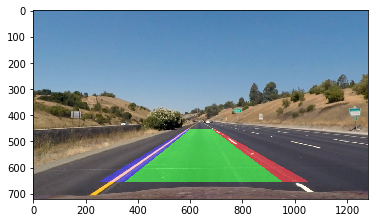

test_images\straight_lines2.jpg


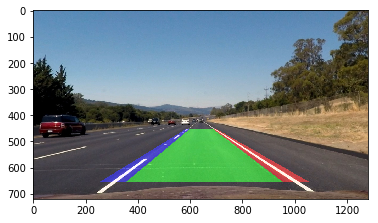

test_images\test1.jpg


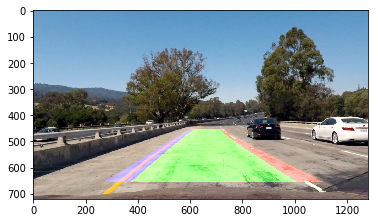

test_images\test2.jpg


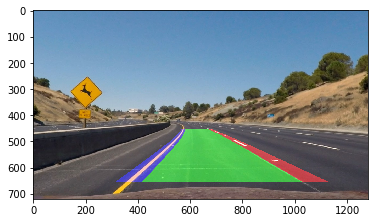

test_images\test3.jpg


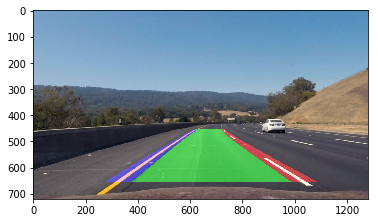

test_images\test4.jpg


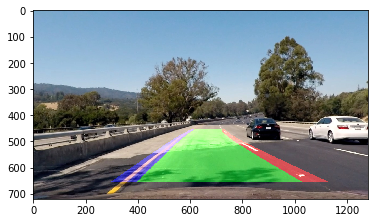

test_images\test5.jpg


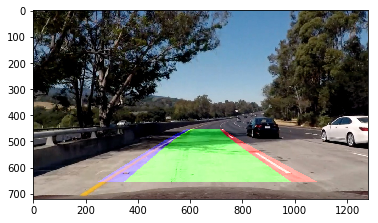

test_images\test6.jpg


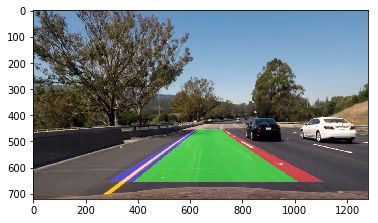

In [8]:
def find_lane_test(path):
    print(path)
    img = cv2.imread(path)
    if len(img.shape) == 3:
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    undistorted = cv2.undistort(img, mtx, dist, None, mtx)
    
    #plt.imshow(undistorted)
    #plt.show()
    img = binarize(img)
    #plt.imshow(img)
    #plt.show()
    img,_ = bird_eye_warp(img)   
    #plt.imshow(img)
    #plt.show()
    img , left_fit, right_fit = find_lane(img)  
    #plt.imshow(img)
    #plt.show()
    img,_ =  bird_eye_warp(img,invers = True)
    #plt.imshow(img)
    #plt.show()
    img = cv2.add(img//2 , undistorted)
    plt.imshow(img)
    plt.show()
    
    return img , left_fit, right_fit

for path in (test_image_paths):
    img , left_fit, right_fit = find_lane_test(path)
 



# Radius of Curvature

Estimations of the curving and the offset toh the middle of the road are calculated and overlayed in the right, upper conner of the image.

In [9]:

import numpy as np
import matplotlib.pyplot as plt

def calc_radius(img,left_fit, right_fit):

    # Define y-value where we want radius of curvature
    # I'll choose the maximum y-value, corresponding to the bottom of the image
    y_eval = 719

    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension

    # Calculate the new radii of curvature
    left_curverad = ((1 + (2*left_fit[0]*y_eval*ym_per_pix + left_fit[1])**2)**1.5) / np.absolute(2*left_fit[0])
    right_curverad = ((1 + (2*right_fit[0]*y_eval*ym_per_pix + right_fit[1])**2)**1.5) / np.absolute(2*right_fit[0])
    # Now our radius of curvature is in meters
    #print(left_curverad, 'm', right_curverad, 'm')
    # Example values: 632.1 m    626.2 m
    
    # Calculate a polinomial value in a given point x

    left_pos = np.poly1d(left_fit)(720)
    right_pos = np.poly1d(right_fit)(720)
    #print(left_pos,right_pos)
    center_pos = (left_pos + right_pos)/2
    #print(center_pos)
    center_offset = center_pos - (1280/2)
    #print(center_offset)
    center_offset_scalefactor = .00431 
    center_offset_m = center_offset * center_offset_scalefactor
    #print(center_offset_m,'m')
    
    cv2.putText(img,'offset: %.2fm' % (center_offset_m),(20,80), cv2.FONT_HERSHEY_SIMPLEX, 1,(255,255,255),2)
    cv2.putText(img,'radius: %.2fm' % ((left_curverad + right_curverad)/2),(20,40), cv2.FONT_HERSHEY_SIMPLEX, 1,(255,255,255),2)
   
    return img


test_images\straight_lines1.jpg
[ -4.21015301e-05   4.42136653e-02   2.89203095e+02] [  2.37113329e-06  -8.46304226e-03   1.00985010e+03]


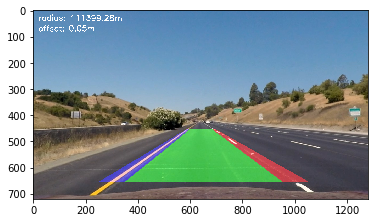

test_images\straight_lines2.jpg
[  6.43910763e-06   3.34375499e-02   2.77565579e+02] [ -2.77904484e-05  -1.82876465e-02   1.03400704e+03]


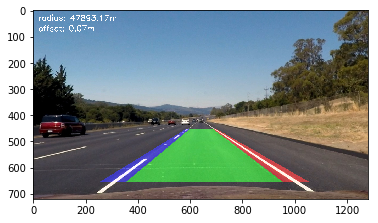

test_images\test1.jpg
[  1.44448689e-04  -2.18289341e-01   4.04011585e+02] [  3.21786599e-04  -4.63637461e-01   1.22697301e+03]


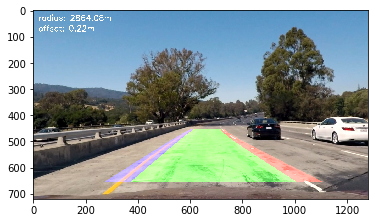

test_images\test2.jpg
[ -3.59973589e-04   5.35787780e-01   1.64868208e+02] [ -2.66260906e-04   4.40178058e-01   9.01678238e+02]


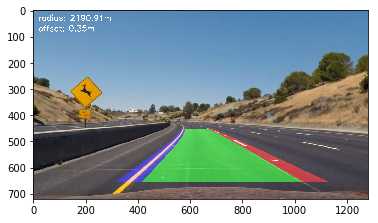

test_images\test3.jpg
[  2.07936560e-04  -4.27330868e-01   5.25658394e+02] [  2.58617227e-04  -4.65865074e-01   1.24020141e+03]


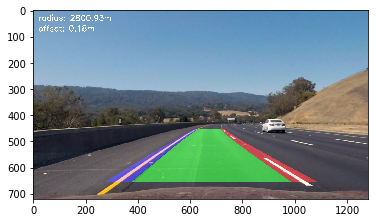

test_images\test4.jpg
[  2.75269743e-04  -3.13522530e-01   4.29291809e+02] [  5.36674650e-04  -6.29016276e-01   1.25567808e+03]


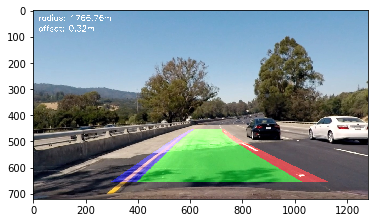

test_images\test5.jpg
[  2.97008843e-04  -2.20339905e-01   3.01677812e+02] [  2.56793913e-04  -4.24944890e-01   1.21166814e+03]


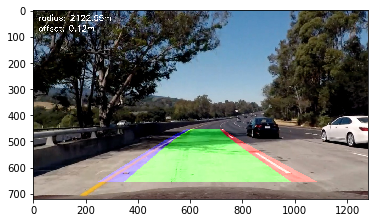

test_images\test6.jpg
[  8.64370887e-06  -2.64051400e-01   5.16562341e+02] [  1.95536189e-04  -4.11241593e-01   1.26145857e+03]


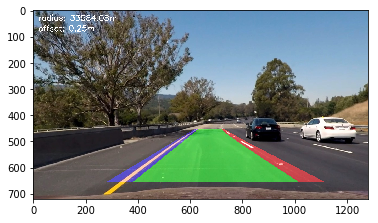

In [10]:
def calc_radius_test(path):
    print(path)
    img = cv2.imread(path)
    if len(img.shape) == 3:
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    undistorted = cv2.undistort(img, mtx, dist, None, mtx)
    #plt.imshow(undistorted)
    #plt.show()
    img = binarize(img)
    plt.imshow(img)
    #plt.show()
    img,_ = bird_eye_warp(img)   
    #plt.imshow(img)
    #plt.show()
    img , left_fit, right_fit = find_lane(img)   
    #plt.imshow(img)
    #plt.show()
    img,_ =  bird_eye_warp(img,invers = True)
    #plt.imshow(img)
    #plt.show()
    img = cv2.add(img//2 , undistorted)
    #plt.imshow(img)
    #plt.show()
    print(left_fit, right_fit)
    img = calc_radius(img,left_fit, right_fit)
    plt.imshow(img)
    plt.show()
    
    return img , left_fit, right_fit

for path in (test_image_paths):
    img , left_fit, right_fit = calc_radius_test(path)

# Video processing

The the Pipeline is defined here and applyed to the Video.

Due to approaching deadline, the pipeline have not yet been finetuned to the challange videos.

In [14]:
def process_frame(img):

    #if len(img.shape) == 3:
    #    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    undistorted = cv2.undistort(img, mtx, dist, None, mtx)
    binarized = binarize(img)
    img,_ = bird_eye_warp(binarized)   
    img , left_fit, right_fit = find_lane(img)   
    img,_ =  bird_eye_warp(img,invers = True)
    img = cv2.add(img//2 , undistorted)
    img = calc_radius(img,left_fit, right_fit)
    
    return img



In [15]:
from moviepy.editor import VideoFileClip

for video_path in video_paths:
    print(video_path)
    clip = VideoFileClip(video_path).fl_image(process_frame)
    clip.write_videofile(video_path[:-4] +'_result.mp4', audio=False)

challenge_video.mp4
[MoviePy] >>>> Building video challenge_video_result.mp4
[MoviePy] Writing video challenge_video_result.mp4


100%|████████████████████████████████████████████████████████████████████████████████| 485/485 [02:45<00:00,  2.90it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: challenge_video_result.mp4 

harder_challenge_video.mp4
[MoviePy] >>>> Building video harder_challenge_video_result.mp4
[MoviePy] Writing video harder_challenge_video_result.mp4


100%|█████████████████████████████████████████████████████████████████████████████▉| 1199/1200 [07:17<00:00,  3.12it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: harder_challenge_video_result.mp4 

project_video.mp4
[MoviePy] >>>> Building video project_video_result.mp4
[MoviePy] Writing video project_video_result.mp4


100%|█████████████████████████████████████████████████████████████████████████████▉| 1260/1261 [06:56<00:00,  3.03it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_result.mp4 

